In [1]:
import json
import pandas as pd
import networkx as nx
# import nxviz as nv
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from plotly.subplots import make_subplots
import scipy
from scipy.stats import pearsonr

# Raw data

In [2]:
with open('../data/raw/artists.json') as input_file:
    artists_raw_data = json.load(input_file)
with open('../data/raw/connections.json') as input_file:
    connections_raw_data = json.load(input_file)
with open('../data/raw/tracks.json') as input_file:
    tracks_raw_data = json.load(input_file)
with open('../data/raw/writers.json') as input_file:
    writers_raw_data = json.load(input_file)

genres_raw_data = []
for artist_id, artist_data in artists_raw_data.items():
    for genre in artist_data['genres']:
        genres_raw_data.append([artist_id, genre])
        
tracks_artist_raw_data = []
for artist_id, tracks in tracks_raw_data.items():
    for track_id, track_info in tracks.items():
        track_row = {"artist_id": artist_id, 'track_id': track_id}
        track_row.update(track_info)
        tracks_artist_raw_data.append(track_row)
        
writers_tracks_raw_data = []
for track_id, track_data in writers_raw_data.items():
    for role in track_data['credits']:
        title = role['roleTitle']
        for artist in role['artists']:
            name = artist['name']
            weight = artist['weight']
            writers_tracks_raw_data.append([track_id, title, name, weight])
        
print("Number of artists:\t", len(artists_raw_data))
print('Number of genres:\t', len(genres_raw_data))
print('Number of connections:\t', len(connections_raw_data))
print('Number of tracks:\t', len(tracks_artist_raw_data))
print('Number of writers:\t', len(writers_tracks_raw_data))

Number of artists:	 10010
Number of genres:	 18436
Number of connections:	 28343
Number of tracks:	 85327
Number of writers:	 76325


In [3]:
artists = pd.DataFrame.from_dict(artists_raw_data).T.reset_index()\
    .rename(columns={'index': 'artist_id'}).drop(columns=['genres'])
artists['popularity'] = artists['popularity'].astype(int)
artists['n_followers'] = artists['n_followers'].astype(int)
artists = artists.sort_values(by='popularity', ascending=False)

In [4]:
artists = artists[artists['popularity'] != 0]
artists.tail()

,artist_id,name,popularity,n_followers
1124,5IgjRRSifP4xAs5h6F98Tc,Tricky Britches,1,248
6008,7dtjgeonwZycxs0B3xBRNA,Ashraf Abu Lel,1,2463
7686,5iFGirNt4KlWjts26w1m95,Regina Regina,1,563
6009,1IGtEmwO0qoyun9befNRVd,Abou Elleef,1,257
6202,5SLS3TumV8I9Dje8GWnEkU,Ghazwan Al fahed,1,4364


In [5]:
genres = pd.DataFrame(genres_raw_data, columns=['artist_id', 'genre'])
genres

,artist_id,genre
0,00FQb4jTyendYWaN8pK0wa,art pop
1,00FQb4jTyendYWaN8pK0wa,pop
2,6CwfuxIqcltXDGjfZsMd9A,dance pop
3,6CwfuxIqcltXDGjfZsMd9A,electropop
4,6CwfuxIqcltXDGjfZsMd9A,metropopolis
...,...,...
18431,4SgbqL3dLr5BfCvBBBUucP,eurodance
18432,4SgbqL3dLr5BfCvBBBUucP,hands up
18433,4SgbqL3dLr5BfCvBBBUucP,pop house
18434,3PP6GfVoBs5ZGlUQjIOAmP,hands up


In [6]:
connections = pd.DataFrame(connections_raw_data, columns=['src_artist_id', 'dst_artist_id'])
connections.sort_values(by='src_artist_id')

,src_artist_id,dst_artist_id
16127,002eDhqXlxtQHdaIKXyf3H,77zNkBGPeehKXAXAXfUfnA
27445,002eDhqXlxtQHdaIKXyf3H,2k9E3OAbvQtys00OmaJTQC
10112,002eDhqXlxtQHdaIKXyf3H,5gGn0EkjlWgn2iVhUccOVC
9691,002eDhqXlxtQHdaIKXyf3H,61ZRdppZ5sCtl9m5gfhoGO
17142,002eDhqXlxtQHdaIKXyf3H,1q4Av58diNwZtD01vPUoH5
...,...,...
16692,7zyOKpGnN06Aq9puD4MceV,7n5cK3EyLmf1JR6gUtJN2g
18245,7zyOKpGnN06Aq9puD4MceV,3aJK7LhPLg4rDr6hTbABzZ
12907,7zyOKpGnN06Aq9puD4MceV,5deamjuel8W5n7pTlf4PHz
9068,7zyOKpGnN06Aq9puD4MceV,1IWsxjHABAgD1ynU826AnF


In [7]:
tracks = pd.DataFrame(tracks_artist_raw_data)
tracks

,artist_id,track_id,name,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,3eskO5m0H4yiF64vRySBjr,1qRA5BS78u3gME0loMl9AA,For What It's Worth,74,0.653,0.519,2.0,-10.164,1.0,0.0497,0.4060,0.020900,0.1010,0.822,98.883,153693.0,4.0
1,3eskO5m0H4yiF64vRySBjr,042v1NacbKJzCyi6nBme7T,Mr. Soul,55,0.674,0.706,9.0,-9.012,1.0,0.0384,0.1080,0.000006,0.1140,0.961,133.789,172400.0,4.0
2,3eskO5m0H4yiF64vRySBjr,4o6jfrxQyekM5DpnWYLlMo,Kind Woman,47,0.680,0.142,9.0,-16.296,1.0,0.0314,0.9280,0.000483,0.1480,0.311,105.370,255773.0,3.0
3,3eskO5m0H4yiF64vRySBjr,3uVmR6oQq0NluVZXkipKHV,Expecting to Fly,44,0.161,0.348,5.0,-13.283,1.0,0.0319,0.7950,0.329000,0.0971,0.123,150.989,224200.0,3.0
4,3eskO5m0H4yiF64vRySBjr,10W7CN0zC8FwRa66JDxpay,On the Way Home,44,0.660,0.501,5.0,-12.005,1.0,0.0270,0.5330,0.000323,0.1450,0.901,119.234,150000.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85322,43c94u7flZbHSdDaUuohqS,6XBUvyvxlfBpOV0FsRpaLG,Glad I'm Gone,18,0.615,0.709,3.0,-6.675,1.0,0.0406,0.3350,0.000167,0.1460,0.837,152.939,213880.0,4.0
85323,43c94u7flZbHSdDaUuohqS,42mOpzCYgiuyo2Xot9UJc7,I Wanna Thank Everyone,14,0.675,0.819,0.0,-6.072,1.0,0.0265,0.0751,0.000000,0.2420,0.819,110.039,273200.0,4.0
85324,43c94u7flZbHSdDaUuohqS,66dOHomjn6awPZ22G7m3SE,Somebody Who Would Die For You,14,0.523,0.493,0.0,-7.843,1.0,0.0319,0.4110,0.000000,0.1520,0.349,135.804,212533.0,4.0
85325,43c94u7flZbHSdDaUuohqS,5zkNhaRT5loU3K1KaEiapi,I Surrender All,13,0.501,0.522,2.0,-6.241,1.0,0.0273,0.2470,0.000000,0.1520,0.407,161.898,229027.0,4.0


In [8]:
writers = pd.DataFrame(writers_tracks_raw_data, columns=['track_id', 'role', 'name', 'weight'])
writers # only role 'Writers' will be retained below

,track_id,role,name,weight
0,6Sv4mpckQh4caTH86kPrWh,Performers,Invention of Light,0.9000
1,6Sv4mpckQh4caTH86kPrWh,Writers,Christopher John Vibberts,0.6999
2,6ovfhC8wXYY3DmGH1qaUG2,Performers,Klaus Sonstad,0.9000
3,6ovfhC8wXYY3DmGH1qaUG2,Writers,Klaus Sonstad,0.6999
4,6ovfhC8wXYY3DmGH1qaUG2,Writers,Åsmund Flaten,0.6997
...,...,...,...,...
76320,07YlxDz2MLAlvIP9rgjFiD,Performers,Rachel Viccaji,0.9000
76321,0CbNnw0OwiLPuHSThzzPs9,Performers,Mashamplani,0.9000
76322,2W4ZxAHZAXOf6r65pCskGR,Performers,Alain Souchon,0.9000
76323,2W4ZxAHZAXOf6r65pCskGR,Writers,Alain Souchon,0.6991


## Genres

In [9]:
px.histogram(genres.groupby('artist_id').count(), x='genre',
            title="Distribution of number of genres assigned to an artist")

In [10]:
px.bar(genres.groupby('genre').count().sort_values(by='artist_id').reset_index().tail(30)\
       .rename(columns={'artist_id': 'n_artists'}), x='genre', y='n_artists',
       title='Top 30 genres most commonly assigned to artists')

## Tracks

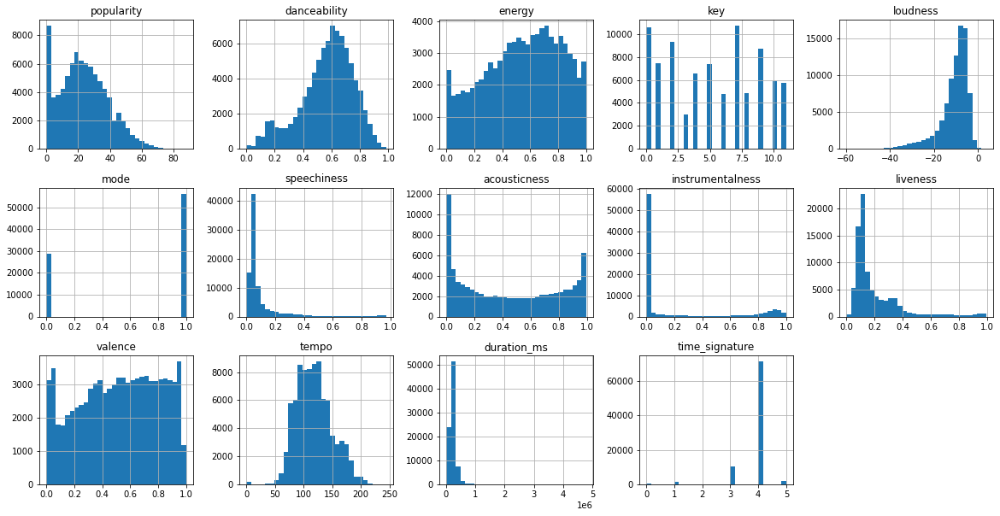

In [11]:
tracks.hist(bins=30, figsize=(20, 10), layout=(3, 5));

In [12]:
px.histogram(tracks, x='duration_ms',
            title='Distribution of tracks duration')

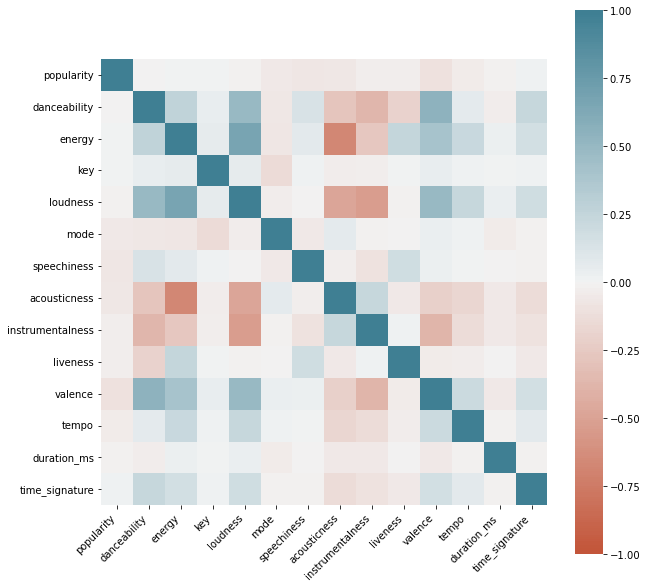

In [13]:
plt.figure(figsize = (10,10))

ax = sns.heatmap(
    tracks.corr(), 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

ax = ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

## Artists

In [14]:
px.histogram(artists, x='popularity',
            title='Popularity distribution among artists')

In [15]:
px.scatter(artists, y='n_followers', x='popularity',
          title='Popularity compared to number of followers')

## Connections

In [16]:
px.histogram(connections.groupby('dst_artist_id').count().reset_index().rename(columns={'src_artist_id':'n_edges'}),
             x='n_edges', title="Distribution of number of edges")

In [17]:
connections.groupby('dst_artist_id').count().reset_index()\
    .rename(columns={'src_artist_id':'n_edges'})\
    .sort_values(by='n_edges', ascending=False)\
    .merge(artists, how='inner', left_on='dst_artist_id', right_on='artist_id').head(30)

,dst_artist_id,n_edges,artist_id,name,popularity,n_followers
0,4DxiFVzQ4xv4YqS7eow6Mn,51,4DxiFVzQ4xv4YqS7eow6Mn,Marc Holland,27,34
1,2O6o9mCeoLTDmsYBamVWBl,50,2O6o9mCeoLTDmsYBamVWBl,Zé Barreto,21,51
2,5LSP2iBRUfSpFUY7xOislt,47,5LSP2iBRUfSpFUY7xOislt,Las Almas Nuevas,39,290
3,3wTwKXCFkSdz39edOCrYve,45,3wTwKXCFkSdz39edOCrYve,Markus Morgenstern,27,35
4,7vlpBGqjj0b2Vmrf1i4Bpl,43,7vlpBGqjj0b2Vmrf1i4Bpl,Oli Bloom,27,26
5,3rO9stUKtSRSDUW0djykCh,39,3rO9stUKtSRSDUW0djykCh,Tostia,27,37
6,25W6u2VnVVME6ZEMSn9Kfa,39,25W6u2VnVVME6ZEMSn9Kfa,Alexander Wurzler,28,28
7,3aymPrB7uRKThm7TCk59Zl,39,3aymPrB7uRKThm7TCk59Zl,Josep De León,27,34
8,0zlPwa6fDx2ICOMDWUzTA7,38,0zlPwa6fDx2ICOMDWUzTA7,Tyler Terrance,27,45
9,5WKLrD3PamTJ6XPLeI3CXg,36,5WKLrD3PamTJ6XPLeI3CXg,Matthias Trapp,27,47


## Writers

In [18]:
px.histogram(writers[writers['role'] == 'Writers'].groupby('track_id').count()['role']
             .reset_index().rename(columns={'role':'n_writers'}),
             x='n_writers', title='Distribution of number of writers per track')

In [19]:
px.histogram(writers[writers['role'] == 'Writers'].groupby('name').count()['track_id']
             .reset_index().rename(columns={'track_id':'n_songs'}),
             x='n_songs', title='Distribution of number of tracks per writer')

In [20]:
writers[writers['role'] == 'Writers'].groupby('name').count()['track_id'].reset_index()\
    .rename(columns={'track_id': 'n_tracks'}).sort_values(by='n_tracks').tail(30)

,name,n_tracks
12936,Pritam,20
2224,Bob Dylan,20
16467,Vairamuthu,20
1008,Andreas Romdhane,21
9295,Lars Kilevold,21
1346,Arne Lindtner Næss,23
873,Amitabh Bhattacharya,23
7324,Javed Akhtar,24
14223,Sameer,26
6241,Harris Jayaraj,26


# Derived data

## Tracks

In [21]:
tracks_info = tracks.merge(artists, how='inner', left_on='artist_id', right_on='artist_id', 
                           suffixes=['_track', '_artist'])

# Discard tracks longer than 10 minutes.
tracks_info = tracks_info[tracks_info['duration_ms'] < 60 * 10 * 1000]

# Convert milliseconds to minutes
tracks_info['duration_minutes'] = tracks_info['duration_ms'] / 1000 / 60

# Since we later normalize the duration it is not anymore in ms.
tracks_info = tracks_info.rename(columns={'duration_ms': 'duration'})

# Discard tracks with popularity less than 3.
tracks_info = tracks_info[tracks_info['popularity_track'] > 3]

# Divide the tracks into 5 popularity groups.
tracks_info['popularity_group_track'] = pd.cut(tracks_info['popularity_track'], 5, labels=range(5))
tracks_info['popularity_group_track'] = tracks_info['popularity_group_track'].astype(int)
tracks_info['popularity_group_track'].astype("category")

# Change mode into a category.
tracks_info['mode'] = tracks_info['mode'].apply(lambda x: 'major' if x == 1 else 'minor')
tracks_info['mode'] = tracks_info['mode'].astype("category")

# Change time signature into a category.
tracks_info['time_signature'] = tracks_info['time_signature'].astype("category")

scaler = MinMaxScaler()
columns_to_scale = ['danceability', 'energy', 'loudness', 'speechiness',
                    'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
                    'duration']
tracks_info[columns_to_scale] = scaler.fit_transform(tracks_info[columns_to_scale])

# Discard all but the 3 most popular songs for each artist.
tracks_info = tracks_info.sort_values(by='popularity_track', ascending=False).groupby('artist_id').head(3)

# Save track_ids for writer scraping.
# track_ids = set(tracks_info['track_id'])
# with open('tracks_writers.json', 'w') as output_file:
#     json.dump(list(track_ids), output_file)

tracks_info

,artist_id,track_id,name_track,popularity_track,danceability,energy,key,loudness,mode,speechiness,...,liveness,valence,tempo,duration,time_signature,name_artist,popularity_artist,n_followers,duration_minutes,popularity_group_track
29332,3rWZHrfrsPBxVy692yAIxF,0y60itmpH0aPKsFiGxmtnh,Wait a Minute!,88,0.775635,0.705,3.0,0.858836,minor,0.028868,...,0.094965,0.672,0.415015,0.292075,4.0,WILLOW,78,2155940,3.275333,4
33432,77SW9BnxLY8rJ0RciFqkHh,2QjOHCTQ1Jl3zawyYOpxh6,Sweater Weather,88,0.621320,0.807,10.0,0.897791,major,0.034891,...,0.101712,0.398,0.509726,0.369090,4.0,The Neighbourhood,82,9127794,4.006667,4
33433,77SW9BnxLY8rJ0RciFqkHh,2K7xn816oNHJZ0aVqdQsha,Softcore,86,0.583756,0.568,9.0,0.855207,minor,0.031153,...,0.288016,0.370,0.386182,0.309205,4.0,The Neighbourhood,82,9127794,3.438000,4
33434,77SW9BnxLY8rJ0RciFqkHh,5E30LdtzQTGqRvNd7l6kG5,Daddy Issues,85,0.596954,0.521,10.0,0.792853,major,0.034164,...,0.123867,0.337,0.349309,0.403794,4.0,The Neighbourhood,82,9127794,4.336217,4
29333,3rWZHrfrsPBxVy692yAIxF,07MDkzWARZaLEdKxo6yArG,Meet Me At Our Spot,83,0.784772,0.470,2.0,0.817009,major,0.031049,...,0.085700,0.399,0.390328,0.232682,4.0,WILLOW,78,2155940,2.711333,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52888,2NBSVAE2AT3AYi39tmIXVG,5inXaX36FLf0TDTzHfNnto,Five Miles From Town,4,0.525888,0.481,9.0,0.803992,major,0.065421,...,0.217523,0.644,0.503238,0.284095,4.0,Susie Goehring,4,358,3.199550,0
52917,7DcrJaiGI7b3B855pxNgA5,3Ef5q7Di1rqp7NQUSNUKUB,Ne nuk q... per asnje shkerdhate (Ver. Origjinal),4,0.806091,0.671,11.0,0.780230,minor,0.085566,...,0.115811,0.683,0.410898,0.536948,4.0,G-Bani,11,1976,5.600650,0
52918,7DcrJaiGI7b3B855pxNgA5,0bQkeulhHTl3JSjy3776Bp,Gia Panta,4,0.835533,0.687,9.0,0.795961,minor,0.060021,...,0.137966,0.627,0.534121,0.323025,4.0,G-Bani,11,1976,3.569233,0
63314,3zkp7yGbBUROefkivkGCtw,6dH3o1nnZIUuvvsjmhCgDE,Neeve Yehova,4,0.613198,0.559,7.0,0.785768,minor,0.043718,...,0.082880,0.534,0.390123,0.411372,4.0,Quincy Chettupally,2,62,4.408183,0


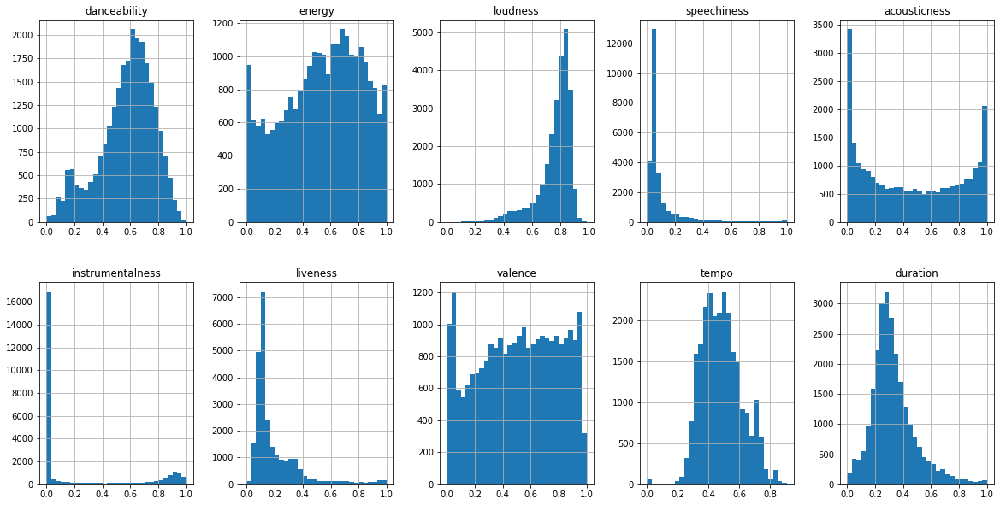

In [22]:
# import numpy as np

# tracks_info['log_speechiness'] = np.log(tracks_info['speechiness'])
# tracks_info['log_loudness'] = np.log(tracks_info['loudness'])
# tracks_info['log_liveness'] = np.log(tracks_info['liveness'])
# tracks_info['log_instrumentalness'] = np.log(tracks_info['instrumentalness'])

#TODO: Standardize distributions
tracks_info[columns_to_scale].hist(bins=30, figsize=(20, 10), layout=(2, 5));

In [23]:
px.histogram(tracks_info, x='duration_minutes',
            title='Distribution of song duration')

In [24]:
px.density_heatmap(tracks_info, y='popularity_track', x='duration_minutes',
           marginal_x="histogram", marginal_y="histogram",
           title='Number of tracks with specific popularity and duration')

In [25]:
track_groups = tracks_info[['popularity_group_track'] + columns_to_scale].groupby('popularity_group_track')\
    .mean().reset_index()
track_groups.corr()[['popularity_group_track']]\
    .sort_values(by='popularity_group_track').style.background_gradient(cmap='coolwarm')

,popularity_group_track
speechiness,-0.985925
liveness,-0.975178
acousticness,-0.887130
instrumentalness,-0.846693
duration,-0.707585
valence,-0.576950
tempo,-0.410598
danceability,0.602295
energy,0.615789
loudness,0.691396


In [26]:
popularity_groups = ['G0', 'G1', 'G2', 'G3', 'G4']

fig = make_subplots(rows=3, cols=3, 
                   subplot_titles=['speechiness', 'liveness', 'acousticness', 'instrumentalness', 
                                   'loudness', 'valence', 'energy', 'danceability', 'tempo'])

fig.add_trace(go.Bar(name='speechiness', x=popularity_groups, y=track_groups['speechiness']),row=1, col=1)
fig.add_trace(go.Bar(name='liveness', x=popularity_groups, y=track_groups['liveness']), row=1, col=2)
fig.add_trace(go.Bar(name='acousticness', x=popularity_groups, y=track_groups['acousticness']), row=1, col=3)
fig.add_trace(go.Bar(name='instrumentalness', x=popularity_groups, y=track_groups['instrumentalness']),row=2, col=1)
fig.add_trace(go.Bar(name='loudness', x=popularity_groups, y=track_groups['loudness']), row=2, col=2)
fig.add_trace(go.Bar(name='valence', x=popularity_groups, y=track_groups['valence']), row=2, col=3)
fig.add_trace(go.Bar(name='energy', x=popularity_groups, y=track_groups['energy']), row=3, col=1)
fig.add_trace(go.Bar(name='danceability', x=popularity_groups, y=track_groups['danceability']), row=3, col=2)
fig.add_trace(go.Bar(name='tempo', x=popularity_groups, y=track_groups['tempo']), row=3, col=3)

fig.update_layout(title_text="Mean track features in different track popularity groups", showlegend=False,
                 width=980, height=1200,)
fig.show()

## Artists

In [27]:
# Include number of genre assigned to artists.
artists_info = artists.merge(genres.groupby('artist_id').count().reset_index().rename(columns={'genre': 'n_genre'}),
                             how='left', left_on='artist_id', right_on='artist_id')

# We do not have genres for all artists.
artists_info['n_genre'] = artists_info['n_genre'].fillna(0).astype(int)

# Include mean track characteristic for artists.
artists_info = artists_info.merge(tracks_info.groupby('artist_id').mean().reset_index(), 
                                  how='left', left_on='artist_id', right_on='artist_id', 
                                  suffixes=['_artist', '_track'])

# Include number of incoming edges for this artist.
artists_info = artists_info.merge(connections.groupby('dst_artist_id').count().reset_index()
                                  .rename(columns={'src_artist_id': 'n_in_edges', 'dst_artist_id': 'artist_id'}),
                                  how='left', left_on='artist_id', right_on='artist_id')

# We do not have connections for all artists.
artists_info['n_in_edges'] = artists_info['n_in_edges'].fillna(0).astype(int)

artists_info.sort_values(by='n_in_edges')

,artist_id,name,popularity,n_followers_artist,n_genre,popularity_track,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,duration,popularity_artist,n_followers_track,duration_minutes,popularity_group_track,n_in_edges
0,00FQb4jTyendYWaN8pK0wa,Lana Del Rey,84,16470577,2,79.000000,0.463283,0.546333,6.333333,0.801441,...,0.002692,0.105304,0.2563,0.502270,0.409274,84.0,16470577.0,4.388256,4.0,0
5434,14XL0D5mFG7yvGTVYrVXv5,David Garrick,26,3748,3,29.666667,0.673773,0.350333,6.000000,0.747970,...,0.017867,0.176435,0.6890,0.405811,0.225318,26.0,3748.0,2.641406,1.0,1
5432,5MJHTQ8SRJZCMeYHeYHmCm,Frederic Frenet,26,17,0,18.333333,0.453469,0.301667,5.000000,0.467708,...,0.609767,0.616650,0.4077,0.456404,0.058222,26.0,17.0,1.054661,0.0,1
5431,4GxVmha4ELBwUE4bPyChzS,Glenn Yarbrough,26,13433,1,30.666667,0.490694,0.307333,5.333333,0.720843,...,0.053877,0.186908,0.4310,0.500473,0.214499,26.0,13433.0,2.538667,1.0,1
5423,1NmH2uqQSKMTOaUMCyHkkH,Lovemotives,26,3683,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4596,7vlpBGqjj0b2Vmrf1i4Bpl,Oli Bloom,27,26,1,27.000000,0.607107,0.085150,5.500000,0.675071,...,0.917000,0.112286,0.2080,0.346819,0.198541,27.0,26.0,2.387133,1.0,43
4609,3wTwKXCFkSdz39edOCrYve,Markus Morgenstern,27,35,0,28.500000,0.434518,0.124450,9.000000,0.662536,...,0.935500,0.108258,0.3015,0.414890,0.258710,27.0,35.0,2.958500,1.0,45
2049,5LSP2iBRUfSpFUY7xOislt,Las Almas Nuevas,39,290,1,45.000000,0.531980,0.239333,7.333333,0.702398,...,0.932333,0.105774,0.3230,0.463107,0.295802,39.0,290.0,3.310722,2.0,47
6621,2O6o9mCeoLTDmsYBamVWBl,Zé Barreto,21,51,1,31.500000,0.471574,0.102950,7.000000,0.716157,...,0.930000,0.107251,0.2685,0.432874,0.266720,21.0,51.0,3.034558,1.5,50


In [28]:
px.histogram(artists_info, x='n_in_edges')

In [29]:
artists_info.sort_values(by='n_in_edges').tail(10)

,artist_id,name,popularity,n_followers_artist,n_genre,popularity_track,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,duration,popularity_artist,n_followers_track,duration_minutes,popularity_group_track,n_in_edges
4591,3QrTQRLyYqfw8K2zzFsEn4,Christopher Renault,27,23,0,28.5,0.513706,0.109650,7.000000,0.663309,...,0.914500,0.111279,0.1665,0.470785,0.278857,27.0,23.0,3.149817,1.0,36
4612,0zlPwa6fDx2ICOMDWUzTA7,Tyler Terrance,27,45,1,28.5,0.585279,0.077800,7.000000,0.643413,...,0.939500,0.111782,0.2555,0.509972,0.292960,27.0,45.0,3.283733,1.0,38
4456,25W6u2VnVVME6ZEMSn9Kfa,Alexander Wurzler,28,28,0,29.0,0.532995,0.096400,6.500000,0.680767,...,0.902000,0.109768,0.1985,0.386887,0.241538,28.0,28.0,2.795433,1.0,39
4631,3aymPrB7uRKThm7TCk59Zl,Josep De León,27,34,1,34.5,0.539594,0.073650,5.000000,0.663514,...,0.946000,0.108258,0.2480,0.370156,0.275973,27.0,34.0,3.122425,1.5,39
4630,3rO9stUKtSRSDUW0djykCh,Tostia,27,37,1,45.0,0.541117,0.066700,9.000000,0.628889,...,0.940000,0.103726,0.2120,0.370338,0.229593,27.0,37.0,2.682000,2.0,39
4596,7vlpBGqjj0b2Vmrf1i4Bpl,Oli Bloom,27,26,1,27.0,0.607107,0.085150,5.500000,0.675071,...,0.917000,0.112286,0.2080,0.346819,0.198541,27.0,26.0,2.387133,1.0,43
4609,3wTwKXCFkSdz39edOCrYve,Markus Morgenstern,27,35,0,28.5,0.434518,0.124450,9.000000,0.662536,...,0.935500,0.108258,0.3015,0.414890,0.258710,27.0,35.0,2.958500,1.0,45
2049,5LSP2iBRUfSpFUY7xOislt,Las Almas Nuevas,39,290,1,45.0,0.531980,0.239333,7.333333,0.702398,...,0.932333,0.105774,0.3230,0.463107,0.295802,39.0,290.0,3.310722,2.0,47
6621,2O6o9mCeoLTDmsYBamVWBl,Zé Barreto,21,51,1,31.5,0.471574,0.102950,7.000000,0.716157,...,0.930000,0.107251,0.2685,0.432874,0.266720,21.0,51.0,3.034558,1.5,50
4638,4DxiFVzQ4xv4YqS7eow6Mn,Marc Holland,27,34,1,35.0,0.509645,0.102500,5.500000,0.679654,...,0.945000,0.111782,0.2580,0.547162,0.223867,27.0,34.0,2.627625,1.5,51


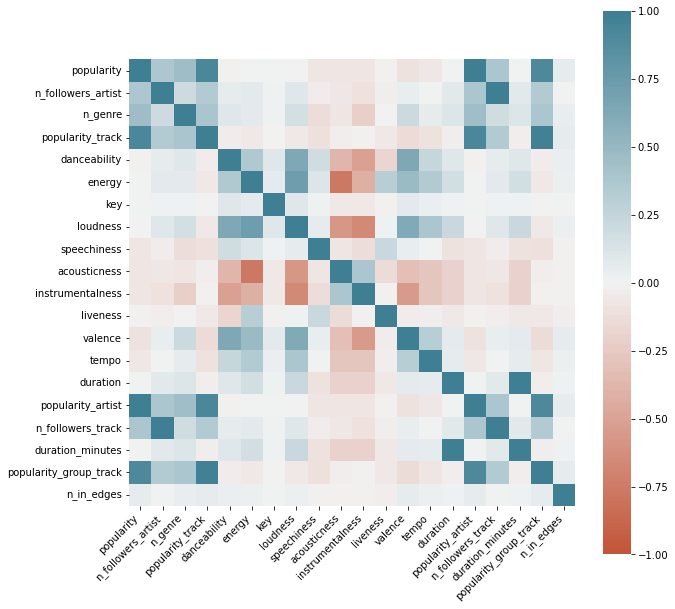

In [30]:
# Correlations in the artists' dataframe
plt.figure(figsize = (10,10))

ax = sns.heatmap(
    artists_info.corr(),
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

ax = ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

In [31]:
px.box(artists_info, x='n_genre', y='popularity_artist',
      title='Artist popularity compared to the number of genres assigned to them')

In [32]:
fig = px.scatter(artists_info, x='popularity_artist', y='popularity_track', color='n_genre',
                title='Artist popularity compared to their average track popularity')
fig.update_layout(shapes = [{'type': 'line', 'yref': 'paper', 'xref': 
                             'paper', 'y0': 0, 'y1': 1, 'x0': 0, 'x1': 1}])

## Genre

In [33]:
# Add artist information to genres
genres_info = genres.merge(artists_info[['artist_id', 'popularity', 'n_genre', 'duration_minutes', 'popularity_group_track']],
                           how='inner', left_on='artist_id', right_on='artist_id')
# Group by genre and get average artist information per genre
genres_info = genres_info.groupby('genre').agg({'artist_id': 'count',
                                                'popularity' : 'mean',
                                                'duration_minutes': 'mean',
                                                'popularity_group_track': 'mean'}).reset_index()\
    .rename(columns={'artist_id': 'n_artists', 
                     'popularity': 'avg_popularity_artist', 
                     'duration_minutes': 'avg_duration_minutes',
                     'popularity_group_track': 'avg_popularity_group_track'})
# Remove genre that has less than 10 artists (fringe genre)
genres_info = genres_info[genres_info['n_artists'] >= 10]
genres_info

,genre,n_artists,avg_popularity_artist,avg_duration_minutes,avg_popularity_group_track
0,432hz,12,27.500000,5.112213,0.878788
5,acoustic blues,163,29.950920,3.783102,1.174897
8,adult standards,128,43.593750,3.084199,2.033854
11,african rock,65,22.123077,3.787339,0.728205
12,afrikaans,91,24.010989,3.597091,0.754579
...,...,...,...,...,...
1135,world fusion,17,38.941176,5.992462,1.686275
1136,world meditation,52,34.500000,2.942391,1.384615
1141,yacht rock,18,47.222222,4.030974,2.333333
1142,ye ye,13,43.384615,3.504694,1.769231


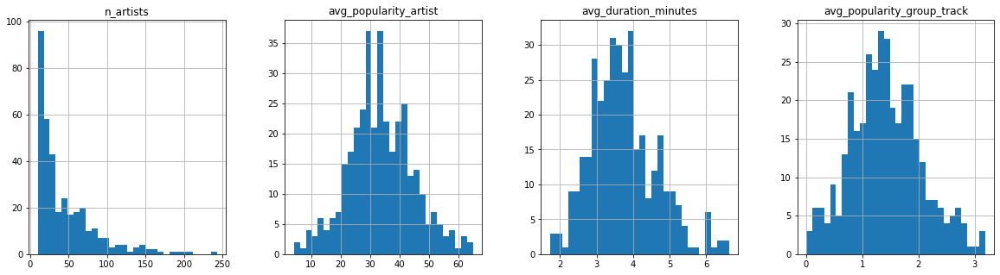

In [34]:
genres_info.hist(bins=30, figsize=(20, 5), layout=(1, 4));

In [35]:
px.scatter(genres_info.sort_values(by='avg_popularity_artist', ascending=False).head(30), 
           y="avg_popularity_artist", x="genre", size='n_artists', color='avg_duration_minutes',
           title='Top 30 genres sorted by average popularity of artists assigned to them')


## Writers

In [36]:
# We take into account only writers.
writers_info = writers[writers['role'] == 'Writers']

# Remove records that do not name a person.
writers_info = writers_info[writers_info['name'] != '']
writers_info = writers_info[writers_info['name'] != '-']
writers_info = writers_info[writers_info['name'] != 'N/A']
writers_info = writers_info[writers_info['name'] != 'Unknown']
writers_info = writers_info[writers_info['name'] != 'Traditional']
writers_info = writers_info[writers_info['name'] != 'Traditionnel']

# Merge together with tracks
writers_info = writers_info.merge(tracks_info, how='inner', left_on='track_id', right_on='track_id')

# Values are clustered around specific values and differ only on lower decimal digits. 
# We round to 2 digits to "cluster" them.
writers_info['weight'] = writers_info['weight'].round(1)

# Clean '131:' from the name of certain writers.
writers_info['name'] = writers_info['name'].apply(lambda x: x[4:] if x.startswith('131:') else x)

# Select only relevant columns
writers_info = writers_info[['name', 'role', 'track_id', 'artist_id', 'popularity_track', 'popularity_artist', 'weight']]

writers_info

,name,role,track_id,artist_id,popularity_track,popularity_artist,weight
0,Christopher John Vibberts,Writers,6Sv4mpckQh4caTH86kPrWh,4xPJreMS73eeI1VNIk0paF,22,27,0.7
1,Klaus Sonstad,Writers,6ovfhC8wXYY3DmGH1qaUG2,1kfV65j2USjFsFbUSJK8DR,19,25,0.7
2,Åsmund Flaten,Writers,6ovfhC8wXYY3DmGH1qaUG2,1kfV65j2USjFsFbUSJK8DR,19,25,0.7
3,Dieter Wiesmann,Writers,12LkVK4F1Tq0bLtzl7wkpf,1zL2X6GRAdvhyR7ifb858b,25,23,0.7
4,Girishh G,Writers,3Okg2J7WlBjMdHK39wNUd2,5VvulDYNoxmP3ey1yGddvB,42,30,0.7
...,...,...,...,...,...,...,...
31608,Jim Keltner,Writers,0JKjK5JsCQvkwpES94lPtW,25pr3OydT7O7v6ZOzSXrsE,38,28,0.5
31609,John Hiatt,Writers,0JKjK5JsCQvkwpES94lPtW,25pr3OydT7O7v6ZOzSXrsE,38,28,0.5
31610,Nicholas Lowe,Writers,0JKjK5JsCQvkwpES94lPtW,25pr3OydT7O7v6ZOzSXrsE,38,28,0.5
31611,Ry Cooder,Writers,0JKjK5JsCQvkwpES94lPtW,25pr3OydT7O7v6ZOzSXrsE,38,28,0.5


In [37]:
px.violin(writers_info, x='weight', y='popularity_track', title='Distribution of writer weights')

In [38]:
writers_info['weight'].round(2).unique()

array([0.7, 0.5, 0. , 0.9, 0.6])

# Undirected graph of related artists

In [39]:
with open('../data/raw/artists.json') as input_file:
    artists_raw_data = json.load(input_file)
with open('../data/raw/connections.json') as input_file:
    connections_raw_data = json.load(input_file)

rel_artist_graph = nx.Graph()

for artist_id, artist_attributes in artists_raw_data.items():
    del artist_attributes['genres']
    rel_artist_graph.add_node(artist_id, **artist_attributes)
    
for src_artist_id, dst_artist_id in connections_raw_data:
    rel_artist_graph.add_edge(src_artist_id, dst_artist_id)
    
nx.write_gexf(rel_artist_graph, "../data/graphs/rel_artist_graph.gexf")

### Hops from Lana Del Rey to the most popular Indian Artist Shreya Goshal

In [40]:
artists_info[artists_info['name'] == 'Lana Del Rey']

,artist_id,name,popularity,n_followers_artist,n_genre,popularity_track,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,duration,popularity_artist,n_followers_track,duration_minutes,popularity_group_track,n_in_edges
0,00FQb4jTyendYWaN8pK0wa,Lana Del Rey,84,16470577,2,79.0,0.463283,0.546333,6.333333,0.801441,...,0.002692,0.105304,0.2563,0.50227,0.409274,84.0,16470577.0,4.388256,4.0,0


In [41]:
artists_info[artists_info['name'] == 'Shreya Ghoshal']

,artist_id,name,popularity,n_followers_artist,n_genre,popularity_track,danceability,energy,key,loudness,...,instrumentalness,liveness,valence,tempo,duration,popularity_artist,n_followers_track,duration_minutes,popularity_group_track,n_in_edges
4,0oOet2f43PA68X5RxKobEy,Shreya Ghoshal,77,11943393,3,69.666667,0.631472,0.601333,2.0,0.827417,...,0.000005,0.118899,0.623333,0.52278,0.319004,77.0,11943393.0,3.53105,3.0,2


# Undirected bipartite graph of writers and artists

In [42]:
def bipartite_graphs(df, name):
    # Dataframe must have writer_name and artist_name columns
    writer_names = list(df['writer_name'].unique())
    artist_names = list(df['artist_name'].unique())

    graph = nx.Graph()

    # We add all writers to bipartite=0
    for writer_name in writer_names:
        graph.add_node(writer_name, bipartite=0)

    # We add all artists to bipartite=0
    for artist_name in artist_names:
        graph.add_node(artist_name, bipartite=1)

    # We create edges for each row in the dataset between writer and artist
    for row_id, row in bi_df.iterrows():
        graph.add_edge(row['writer_name'], row['artist_name'])

    nx.write_gexf(graph, f"../data/graphs/{name}_bi.gexf")

    nx.write_gexf(bipartite.weighted_projected_graph(graph, writer_names), 
                  f"../data/graphs/{name}_bi_proj_weight-writers.gexf")

    nx.write_gexf(bipartite.weighted_projected_graph(graph, artist_names), 
                  f"../data/graphs/{name}_bi_proj_weight-artists.gexf")

    nx.write_gexf(bipartite.collaboration_weighted_projected_graph(graph, writer_names), 
                  f"../data/graphs/{name}_bi_proj_weight_collab-writers.gexf")

    nx.write_gexf(bipartite.collaboration_weighted_projected_graph(graph, artist_names), 
                  f"../data/graphs/{name}_bi_proj_weight_collab-artists.gexf")
    
    return graph

## All writers and artists

In [43]:
from networkx.algorithms import bipartite

bi_df = writers_info.rename(columns={'name': 'writer_name'})[['writer_name', 'role', 'track_id', 'artist_id']]
bi_df = bi_df.merge(artists_info[['artist_id', 'name']], how='inner', left_on='artist_id', right_on='artist_id')\
    .rename(columns={'name': 'artist_name'})
bi_df['writer_name'] = '(W) ' + bi_df['writer_name']
bi_df['artist_name'] = '(A) ' + bi_df['artist_name']
bi_df = bi_df.groupby(['writer_name', 'artist_name']).first().reset_index()[['writer_name', 'artist_name']]

bi_df_graph = bipartite_graphs(bi_df, 'all')

bi_df

,writer_name,artist_name
0,(W) !magnic!,(A) !magnic!
1,"(W) ""A"". Jones",(A) Quasamodo
2,(W) & Rick Wright,(A) Greensky Bluegrass
3,(W) -M-,(A) -M-
4,(W) -M-,(A) Vanessa Paradis
...,...,...
23574,(W) 한선우 SunwoOo,(A) EK
23575,(W) 한재완,(A) Dvwn
23576,(W) 황세현,(A) h3hyeon
23577,(W) 황예원,(A) Dept


## Top 20 most prolific writers

In [44]:
# 20 writers who write for the largest number of artists.
top20_wr = bi_df.groupby('writer_name').count().rename(columns={'artist_name': 'n_artists'})\
    .sort_values(by='n_artists').tail(20).reset_index()\
    .merge(bi_df, how='left', left_on='writer_name', right_on='writer_name')

top20_wr_graph = bipartite_graphs(top20_wr, 'top20_wr')

top20_wr

,writer_name,n_artists,artist_name
0,(W) Kumaar,17,(A) Anand Raj Anand
1,(W) Kumaar,17,(A) Ankit Tiwari
2,(W) Kumaar,17,(A) Farhan Saeed
3,(W) Kumaar,17,(A) Harshdeep Kaur
4,(W) Kumaar,17,(A) Himesh Reshammiya
...,...,...,...
497,(W) DR,41,(A) Ramazo
498,(W) DR,41,(A) Rami Lapache
499,(W) DR,41,(A) Said Rami
500,(W) DR,41,(A) Saîd Mariouari


In [45]:
artist_names = list(top20_wr['artist_name'].unique())
writer_names = list(top20_wr['writer_name'].unique())

# top20_wr_graph_artist = bipartite.weighted_projected_graph(top20_wr_graph, artist_names)
# top20_wr_graph_writers = bipartite.weighted_projected_graph(top20_wr_graph, writer_names)

# Artists bipartite
top20_wr_coll_graph_artist = bipartite.collaboration_weighted_projected_graph(top20_wr_graph, artist_names)
top20_wr_cc_artist = sorted(nx.connected_components(top20_wr_coll_graph_artist), key=len, reverse=True)
top20_wr_g0_artist = top20_wr_coll_graph_artist.subgraph(top20_wr_cc_artist[0])
nx.write_gexf(top20_wr_g0_artist, f"../data/graphs/top20_GC_bi_proj_weight_collab-artists.gexf")

# Writers bipartite
top20_wr_coll_graph_writer = bipartite.collaboration_weighted_projected_graph(top20_wr_graph, writer_names)
top20_wr_cc_writer = sorted(nx.connected_components(top20_wr_coll_graph_writer), key=len, reverse=True)
top20_wr_g0_writer = top20_wr_coll_graph_writer.subgraph(top20_wr_cc_writer[0])
nx.write_gexf(top20_wr_g0_writer, f"../data/graphs/top20_GC_bi_proj_weight_collab-writers.gexf")

In [46]:
# Small world.
# Too slow to run it every time with the notebook.

from networkx.algorithms import sigma, omega

# top20_wr_sigma = sigma(top20_wr_g0_writer, niter=5, nrand=3, seed=42)
# print('Sigma writers:', top20_wr_sigma)
print("Sigma writers: 0.9387218734822811")

# top20_wr_omega = omega(top20_wr_g0_writer, niter=5, nrand=3, seed=42)
# print('Omega writers:', top20_wr_omega)
print("Omega writers: -0.030362715926063988")

# top20_wr_sigma = sigma(top20_wr_g0_artist, niter=5, nrand=3, seed=42)
# print('Sigma artists:', top20_wr_sigma)
print("Sigma artists: 1.9949639472999519")

# top20_wr_omega = omega(top20_wr_g0_artist, niter=5, nrand=3, seed=42)
# print('Omega artists:', top20_wr_omega)
print("Omega artists: -0.04212474121958354")


Sigma writers: 0.9387218734822811
Omega writers: -0.030362715926063988
Sigma artists: 1.9949639472999519
Omega artists: -0.04212474121958354


## Artists with popularity > 50

In [47]:
from networkx.algorithms import bipartite

bi_df_50 = writers_info.rename(columns={'name': 'writer_name'})[['writer_name', 'role', 'track_id', 'artist_id']]
bi_df_50 = bi_df_50.merge(artists_info[['artist_id', 'name', 'popularity']], 
                          how='inner', left_on='artist_id', right_on='artist_id')\
    .rename(columns={'name': 'artist_name'})
bi_df_50['writer_name'] = '(W) ' + bi_df_50['writer_name']
bi_df_50['artist_name'] = '(A) ' + bi_df_50['artist_name']
bi_df_50 = bi_df_50.groupby(['writer_name', 'artist_name']).first().reset_index()\
    [['writer_name', 'artist_name', 'popularity']]
bi_df_50 = bi_df_50[bi_df_50['popularity']>=50]

bipartite_graphs(bi_df_50, 'top50')

bi_df_50

,writer_name,artist_name,popularity
3,(W) -M-,(A) -M-,57
4,(W) -M-,(A) Vanessa Paradis,59
16,(W) 2xxx,(A) Rad Museum,51
98,(W) A. Turest-Swartz,(A) Freshlyground,60
118,(W) A.R. Rahman,(A) Alka Yagnik,73
...,...,...,...
23457,(W) Øyvind Sauvik,(A) Julie Bergan,58
23458,(W) Øyvind Sauvik,(A) K-391,65
23460,(W) Øyvind Sauvik,(A) Tungevaag,66
23575,(W) 한재완,(A) Dvwn,51


#  Only Lana Del Rey writers

In [48]:
ldr_artists = writers_info.merge(artists_info[['artist_id', 'name']], 
                       how='inner', left_on='artist_id', right_on='artist_id')\
    .rename(columns={'name_x': 'writer_name', 'name_y': 'artist_name'})
ldr_artists = ldr_artists[ldr_artists['artist_name'] == "Lana Del Rey"]
ldr_artists['writer_name'] = '(W) ' + ldr_artists['writer_name']
ldr_artists = ldr_artists[['writer_name']].merge(bi_df, how='inner', left_on='writer_name', right_on='writer_name')\
    .groupby(['writer_name', 'artist_name']).first().reset_index()

ldr_artists_graph = bipartite_graphs(ldr_artists, 'ldr-writers')

ldr_artists

,writer_name,artist_name
0,(W) Adam Keefe Horovitz,(A) Lana Del Rey
1,(W) Adam Nathaniel Yauch,(A) Lana Del Rey
2,(W) Barrie O'Neill,(A) Lana Del Rey
3,(W) Bradley James Nowell,(A) Lana Del Rey
4,(W) Dorothy Heyward,(A) Lana Del Rey
5,(W) Dorothy Heyward,"(A) Willie ""The Lion"" Smith"
6,(W) DuBose Heyward,(A) Joanne Shaw Taylor
7,(W) DuBose Heyward,(A) Lana Del Rey
8,(W) George Gershwin,(A) Arthur Prysock
9,(W) George Gershwin,(A) Benny Carter


# Directed graph of artists with popularity > 60 genre graph with n_shared_genre as weight

### Lower to higher popularity direction

In [49]:
# Artist genre; what genres they share with related artists.
df_ag = artists_info[['artist_id', 'name', 'popularity']]
df_ag = df_ag[df_ag['popularity'] > 60]
df_ag = df_ag.merge(genres, how='inner', left_on='artist_id', right_on='artist_id')
df_ag = df_ag.sort_values(by='genre')
df_ag = df_ag.merge(df_ag, how='inner', left_on='genre', right_on='genre', suffixes=['', '_related'])
df_ag['weight'] = df_ag.groupby(['name', 'name_related'])['genre'].transform('count')
df_ag = df_ag.groupby(['name', 'popularity', 'name_related', 'popularity_related', 'weight'])['genre']\
    .apply(list).reset_index()

df_ag[df_ag['name'] ==  'Lana Del Rey']

,name,popularity,name_related,popularity_related,weight,genre
2605,Lana Del Rey,84,AJ Mitchell,62,1,[pop]
2606,Lana Del Rey,84,American Authors,66,1,[pop]
2607,Lana Del Rey,84,Astrid S,67,1,[pop]
2608,Lana Del Rey,84,Bea Miller,69,1,[pop]
2609,Lana Del Rey,84,Beth Gibbons,61,1,[art pop]
2610,Lana Del Rey,84,Chelsea Cutler,69,1,[pop]
2611,Lana Del Rey,84,Daya,69,1,[pop]
2612,Lana Del Rey,84,FKA twigs,65,2,"[art pop, pop]"
2613,Lana Del Rey,84,FLETCHER,66,1,[pop]
2614,Lana Del Rey,84,Fiona Apple,61,1,[art pop]


In [50]:
def get_artist_connections(artist_name):
    # Filter connections by artist name.
    artist_connections = df_ag[df_ag['name'] == artist_name]
    # Take only connections with a lower popularity than our writer - direction of the graph.
    artist_connections = artist_connections[artist_connections['popularity']>=artist_connections['popularity_related']]
    # Transofm the data frame into a list.
    return artist_connections[['name_related', 'weight', 'genre']].values.tolist()

df_ag_degree = df_ag.groupby('name').first().reset_index()[['name', 'popularity']]
df_ag_degree['n_in_edges'] = df_ag_degree['name'].apply(get_artist_connections).apply(lambda x: len(x))
df_ag_degree = df_ag_degree.sort_values(by=['n_in_edges', 'popularity'], ascending=[False, True])

df_ag_degree[df_ag_degree['name']=='Lana Del Rey']

,name,popularity,n_in_edges
76,Lana Del Rey,84,27


In [51]:
# Get a list of names and popularity of artists.
unique_artists = df_ag.groupby('name')['popularity'].first().reset_index().values.tolist()

ag_graph = nx.DiGraph()

# Add nodes to graph.
for name, popularity in unique_artists:
    ag_graph.add_node(name, popularity=popularity)

# Add connections to graph.
for name, popularity in unique_artists:
    artist_connections = get_artist_connections(name)
    # For each connected artist that has a lower or equal popularity.
    for name_related, weight, common_genres in artist_connections:
        # We make connections from the direction of the lower or equal popularity related artist
        ag_graph.add_edge(name_related, name, weight=weight)

nx.write_gexf(ag_graph, "../data/graphs/artist_genre_directed_to_more_popular.gexf")

### Higher to lower popularity direction

In [52]:
# Reversed direction
ag_graph_rev = nx.DiGraph.reverse(ag_graph)
nx.write_gexf(ag_graph_rev, "../data/graphs/artist_genre_directed_to_less_popular.gexf")

## Metrics

In [53]:
# # Obtained in Gephi already.
# nx.eccentricity(graph)
# nx.periphery(graph)
# nx.radius(graph)
# nx.center(graph)
# nx.degree_centrality(graph)
# nx.closeness_centrality(graph)
# nx.degree_centrality(graph)
# nx.betweenness_centrality(graph)
# nx.eigenvector_centrality(graph)
# nx.draw_networkx(graph)
# nx.strongly_connected_components(graph)
# nx.connected_components(graph_undirected)
# nx.core_number(graph)
# nx.k_core(graph, 16)
# # LDR's community group degree centrality - to which node group outside the community is it the closest
# ldr_group_degree = group_degree_centrality(graph, list/set)

### Pearson korrelation between in-degree and popularity

In [54]:
# directed graph of artists based on genre relatednes, weight = no. of common genres, direction: low to high popularity
nx.degree_pearson_correlation_coefficient(ag_graph)

0.03617838176836234

In [55]:
G = ag_graph_rev
G.nodes.data()

NodeDataView({'AJ Mitchell': {'popularity': 62}, 'Abhijeet': {'popularity': 62}, 'Alabama': {'popularity': 62}, 'Alka Yagnik': {'popularity': 73}, 'Allman Brothers Band': {'popularity': 62}, 'America': {'popularity': 64}, 'American Authors': {'popularity': 66}, 'Amit Trivedi': {'popularity': 66}, 'Ankit Tiwari': {'popularity': 63}, 'Anuradha Paudwal': {'popularity': 62}, 'Asha Bhosle': {'popularity': 64}, 'Astrid S': {'popularity': 67}, 'Atif Aslam': {'popularity': 72}, 'B.B. King': {'popularity': 61}, 'Bea Miller': {'popularity': 69}, 'Benny Dayal': {'popularity': 66}, 'Beth Gibbons': {'popularity': 61}, 'Billy Currington': {'popularity': 65}, 'Blake Shelton': {'popularity': 70}, 'Brad Paisley': {'popularity': 65}, 'Brantley Gilbert': {'popularity': 66}, 'Bread': {'popularity': 61}, 'Brett Eldredge': {'popularity': 61}, 'Brooks & Dunn': {'popularity': 69}, 'Caamp': {'popularity': 65}, 'Chase Rice': {'popularity': 62}, 'Chelsea Cutler': {'popularity': 69}, 'Chris Young': {'popularity':

In [56]:
degrees = [val for (node, val) in G.degree()]
x = list(degrees)

In [57]:
pop = dict(G.nodes(data='popularity', default=1))
y = list(pop.values())

In [58]:
scipy.stats.pearsonr(x, y)

(-0.03203624802373954, 0.6991023685200263)

### Link Prediction

In [59]:
nx.jaccard_coefficient(top20_wr_g0_writer)

<generator object _apply_prediction.<locals>.<genexpr> at 0x0000024FEFE8BD60>

### Proximity prestige

In [61]:
distance = []
start_dis = 0
n = 0
for dest in G.nodes:
    start_dis = 0
    n = 0
    for src in G.nodes:
        if (nx.has_path(G,src,dest) == True):
            start_dis = start_dis + nx.shortest_path_length(G,source=src,target=dest)
            n = n + 1
    if start_dis == 0:
        distance.append([dest, 0])
    else:
        distance.append([dest, start_dis/(n - 1)])
print("\nPROXIMITY PRESTIGE :\n")
for i in distance:
    print(str(i[0]) + ", " + str(i[1]))


PROXIMITY PRESTIGE :

AJ Mitchell, 1.7
Abhijeet, 1.0425531914893618
Alabama, 1.9285714285714286
Alka Yagnik, 1.0
Allman Brothers Band, 2.5142857142857142
America, 2.0
American Authors, 1.6296296296296295
Amit Trivedi, 1.0
Ankit Tiwari, 1.05
Anuradha Paudwal, 1.0425531914893618
Asha Bhosle, 1.0294117647058822
Astrid S, 1.3181818181818181
Atif Aslam, 1.0
B.B. King, 2.8160919540229883
Bea Miller, 1.3888888888888888
Benny Dayal, 1.0
Beth Gibbons, 2.7471264367816093
Billy Currington, 1.3448275862068966
Blake Shelton, 1.6666666666666667
Brad Paisley, 1.3448275862068966
Brantley Gilbert, 1.3846153846153846
Bread, 2.413793103448276
Brett Eldredge, 2.057471264367816
Brooks & Dunn, 1.625
Caamp, 1.0
Chase Rice, 1.957142857142857
Chelsea Cutler, 1.8333333333333333
Chris Young, 1.4761904761904763
Cigarettes After Sex, 0
Colt Ford, 2.0434782608695654
DJ Gimi-O, 0
Darius Rucker, 1.3846153846153846
Daya, 1.3888888888888888
Devi Sri Prasad, 1.0
Dhanush, 1.0212765957446808
Dierks Bentley, 1.55555555555

In [62]:
prox_prestige = pd.DataFrame(distance)
prox_prestige.sort_values(by=1, ascending=False).head(10)

,0,1
86,Massive Attack,3.459770
47,Gregory Alan Isakov,2.937500
134,The Paper Kites,2.937500
122,Sir Chloe,2.908046
13,B.B. King,2.816092
88,Mazzy Star,2.747126
16,Beth Gibbons,2.747126
56,Jack Stauber's Micropop,2.621622
146,awfultune,2.621622
87,Matt Maltese,2.621622


In [63]:
prox_prestige[prox_prestige[0] == 'Shania Twain']

,0,1
119,Shania Twain,1.133333


In [64]:
prox_prestige[prox_prestige[0] == 'Lana Del Rey']

,0,1
76,Lana Del Rey,0.0
